# Module: MS5114 - Advanced Programming for Business Analytics
# Student Name: Manoj Hanumantha
# Student Id: 23104580

# Business Question

## How can we use predictive modeling to enhance the user experience and engagement on online music streaming platforms by accurately predicting the danceability of tracks?

# Business Understanding

**Objective:** The objective of this analysis is to understand the relationship between various features of Spotify tracks, particularly focusing on danceability, and to build predictive models to analyse its relationship with other audio features and predict danceability of a song. This analysis can help online music streaming platforms in enhancing their recommendation systems, playlist curation, and user experience.

# Data Understanding

**Data Loading and Inspection:**
*  The data is loaded from a CSV file, and its structure and contents are examined to gain insights into the available features and any missing values.

In [2]:
import pandas as pd
import numpy as np

# Data Understanding
# Loading the data and examining its structure and contents.

# Reading CSV files
data = pd.read_csv(r"C:\Users\Manoj\Desktop\Semester 2 Assignments\Advanced Programming for Business Analytics\Assignment 2\spotify-dataset.csv")

# Define an object df and assign data to df, so that we can differentiate between them, or back them up.
df = data

# View the features of the dataset
df.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


# Data Cleaning and Transformation
*  Missing values are identified and removed based on behavioral criteria. 
*  Explicit data is converted to binary format (0s and 1s) for analysis. 
*  Categorical columns are dropped from the dataset as they are not relevant for the predictive modeling task.

In [3]:
# Viewing missing values in a dataset
df.isnull().sum()

Unnamed: 0          0
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [4]:
# View current information about the dataset, including data type and number of rows and fields.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [5]:
# Remove missing values by behavioral criteria
df = df.dropna()

In [6]:
# Counting missing values again
df.isnull().sum()

Unnamed: 0          0
track_id            0
artists             0
album_name          0
track_name          0
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [7]:
# Remove the column 'Unnamed: 0' from the DataFrame to clean the data
df.drop(columns = 'Unnamed: 0', axis = 1, inplace = True)

C:\Users\Manoj\AppData\Local\Temp\ipykernel_27684\3944411230.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns = 'Unnamed: 0', axis = 1, inplace = True)


In [8]:
# Replacement of explicit data with 0 and 1
df["explicit"] = df["explicit"].astype(int)

C:\Users\Manoj\AppData\Local\Temp\ipykernel_27684\2006419484.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["explicit"] = df["explicit"].astype(int)


In [9]:
# Taking a look at cleansed dataset 
df

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,2C3TZjDRiAzdyViavDJ217,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Sleep My Little Boy,21,384999,0,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5,world-music
113996,1hIz5L4IB9hN3WRYPOCGPw,Rainy Lullaby,#mindfulness - Soft Rain for Mindful Meditatio...,Water Into Light,22,385000,0,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4,world-music
113997,6x8ZfSoqDjuNa5SVP5QjvX,Cesária Evora,Best Of,Miss Perfumado,22,271466,0,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4,world-music
113998,2e6sXL2bYv4bSz6VTdnfLs,Michael W. Smith,Change Your World,Friends,41,283893,0,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4,world-music


# Exploratory Data Analysis (EDA):
*  Utilizing statistical measures and visualizations  to understand the distribution and relationships of numerical features with the target variable danceability. 
*  Correlation analysis is performed to identify potential predictors of danceability.


# Data Preparation

*  Numerical features are selected for modeling, discrete and continuous numerical features are identified separately for further analysis.

In [10]:
# Extracting all the numerical columns from the data frame
feature_numerical=[feature for feature in df.columns if df[feature].dtype!='O']
print('Number of numerical columns=', len(feature_numerical))
df[feature_numerical].head()

Number of numerical columns= 15


,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,73,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4
1,55,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4
2,57,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4
3,71,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3
4,82,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4


In [11]:
# Identifying discrete numerical features with less than 50 unique values.
feature_discrete_numerical=[feature for feature in feature_numerical if data[feature].nunique()<50]
print('Discrete numerical columns:')
feature_discrete_numerical

Discrete numerical columns:


['explicit', 'key', 'mode', 'time_signature']

#### Visualizing the relationship between discrete numerical features and danceability:

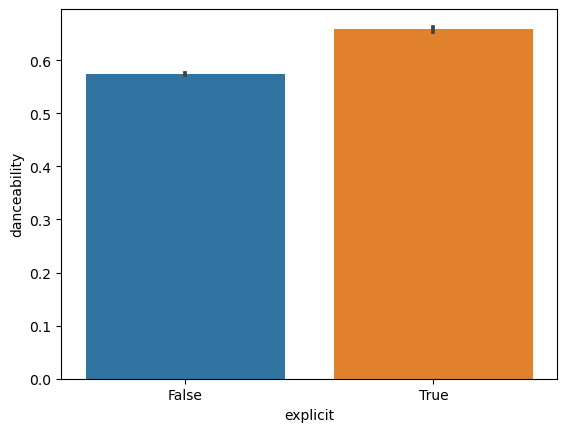

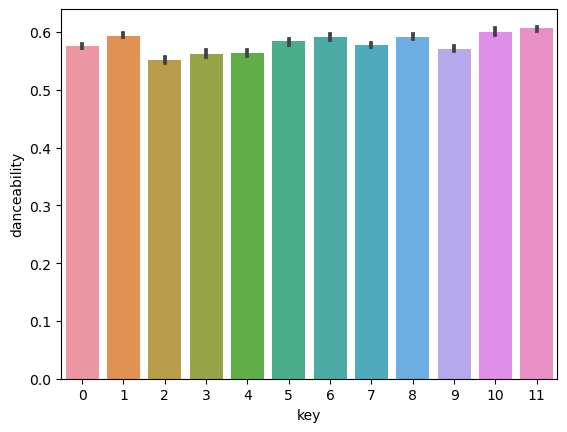

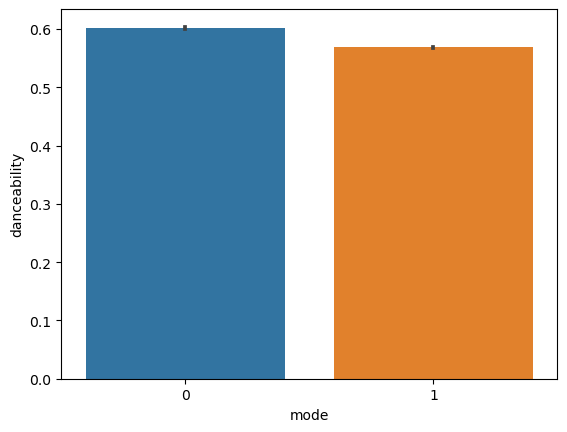

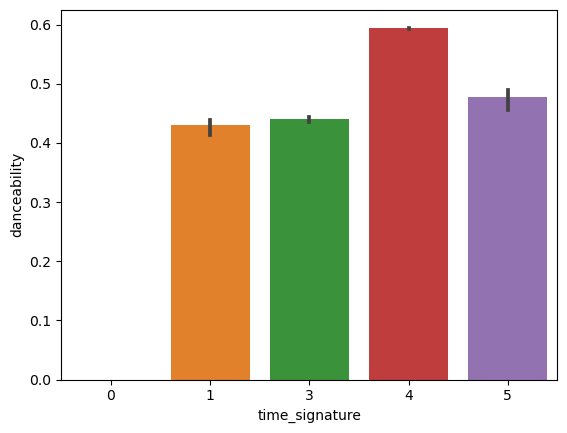

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualizing the relationship between discrete numerical features and danceability.
for feature in feature_discrete_numerical:
    dataset=data.copy()
    sns.barplot(x=feature, y=dataset['danceability'], data=dataset, estimator=np.median)
    plt.show()

**Observations:**

* We see that songs which contain explicit lyrics are more danceable in comparision with songs that do not contain explicit lyrics.
* The danceability of songs or tracks in different keys do not differ much. Songs in all the keys are almost equally danceable.
* The tracks in both the modes are equally danceable, both in the major as well as the minor.
* The time signature is a notational convention to specify how many beats are in each bar. Here time_signature ranges from 0 to 5 and from the bar graph we can see that the tracks having time_signature 4 and 5 are more popular than other.

#### Selecting continuous numerical features, calculating skewness and visualizaing their distribution using histogram:

In [13]:
# Selecting continuous numerical features by excluding discrete numerical features.
features_continuous_numerical=[features for features in feature_numerical if features not in feature_discrete_numerical]
print('Continuous numerical columns:')
features_continuous_numerical

Continuous numerical columns:


['popularity',
 'duration_ms',
 'danceability',
 'energy',
 'loudness',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo']

popularity skewness is : 0.04640190527012667


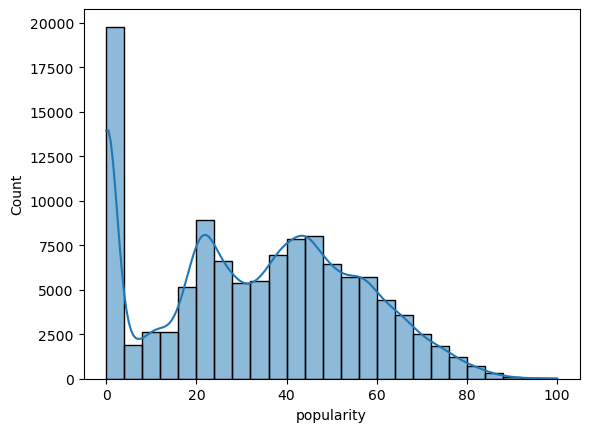

duration_ms skewness is : 11.195034174569583


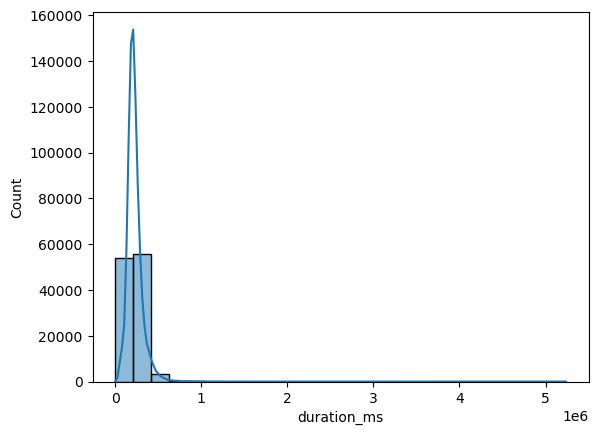

danceability skewness is : -0.39949137696049875


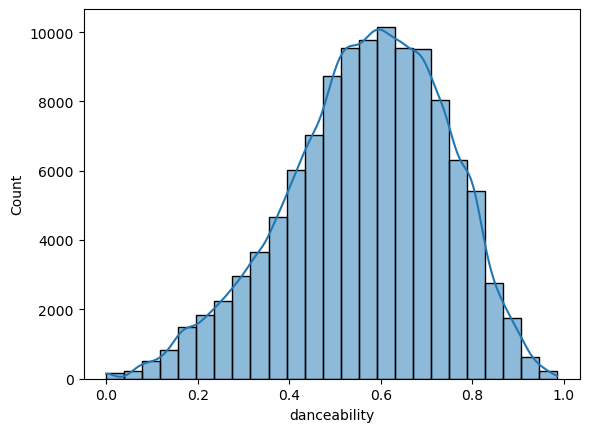

energy skewness is : -0.5969935617097103


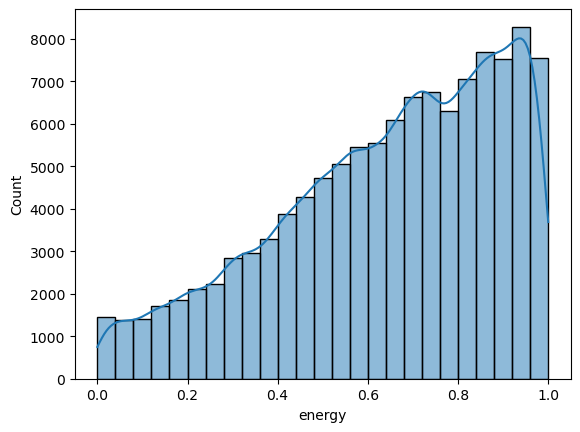

loudness skewness is : -2.0065155317630916


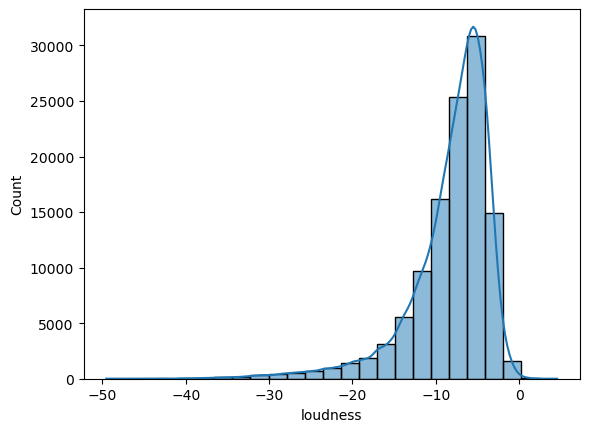

speechiness skewness is : 4.647454866076131


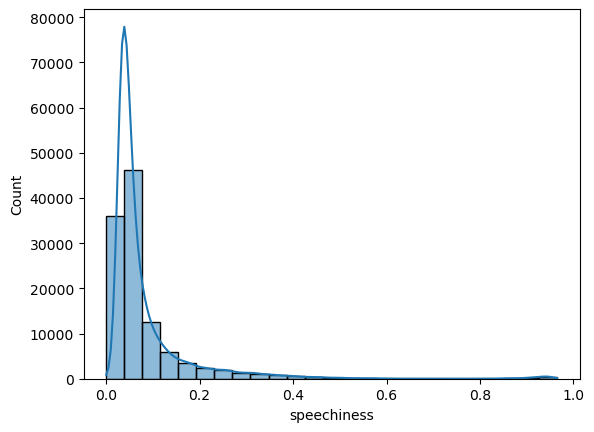

acousticness skewness is : 0.7272852910175864


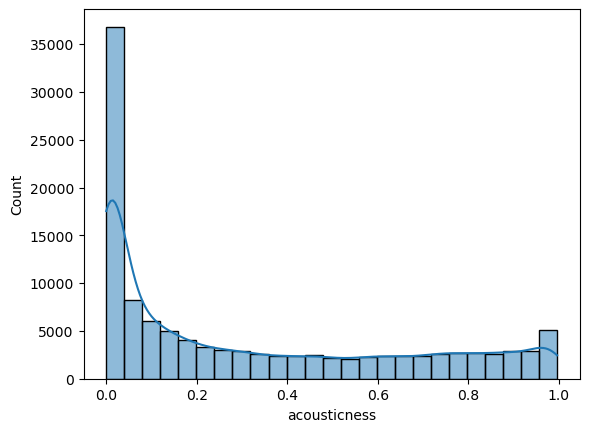

instrumentalness skewness is : 1.734383371462091


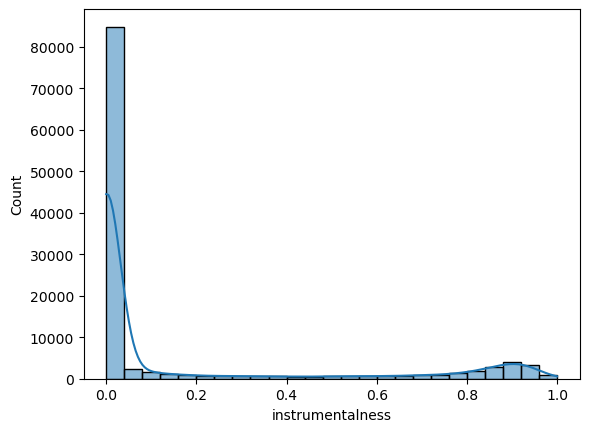

liveness skewness is : 2.105710409930272


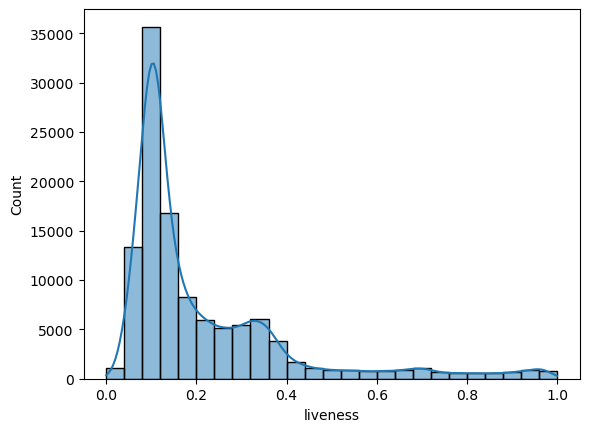

valence skewness is : 0.11507652786076844


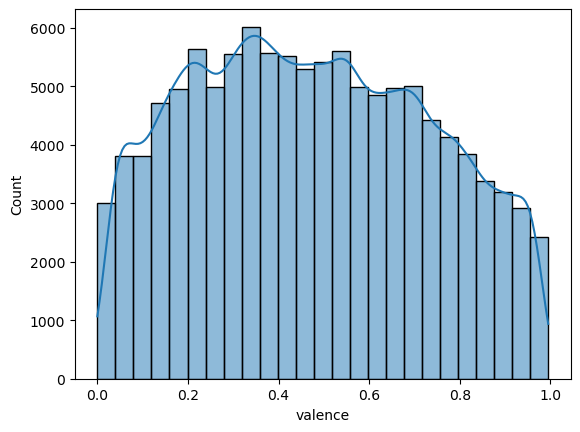

tempo skewness is : 0.23229180402927552


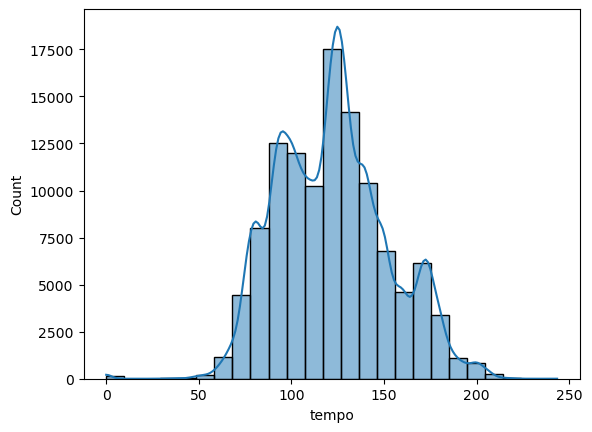

In [14]:
from scipy.stats import skew

# Calculating skewness for each continuous numerical feature and visualizing their distribution using a histogram.
for feature in features_continuous_numerical:
    dataset=data.copy()
    print(feature, 'skewness is :', skew(dataset[feature]))
    sns.histplot(x=feature, data=dataset, bins=25, kde=True)
    plt.show()

**Observations:**

* We see that danceability, valence and tempo are almost normal distribution.
* Loudness is left skewed.
* Rest all the features are right skewed.

**Correlation matrix to analyse correlation between various features of music audio data:**

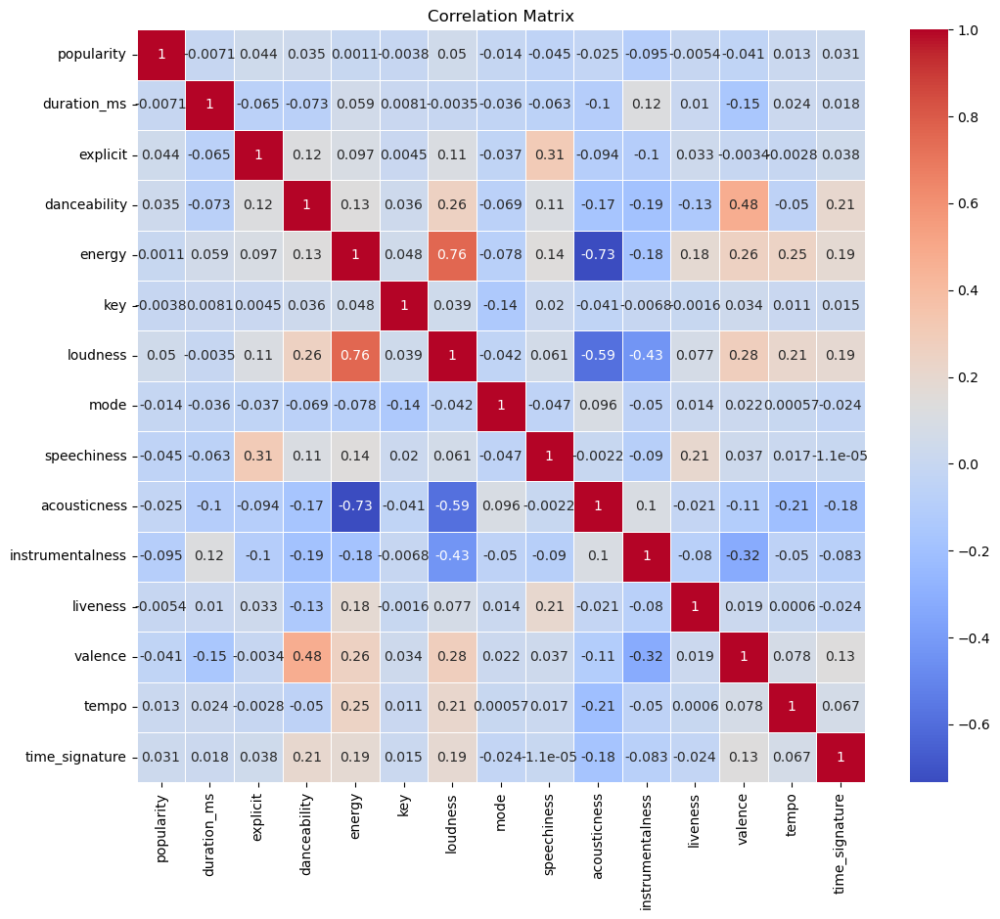

In [15]:
# Correlation Matrix 
corr_matrix = df.select_dtypes(include=["int", "float"]).corr()

# Plotting a heat map
plt.figure(figsize=(12, 10))  # Setting a larger area
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, annot_kws={"size": 10})
plt.title('Correlation Matrix')
plt.show()

**Observations:**

* **Speechiness** has a negative correlation with liveness (-0.0054). This means that songs with a lot of speech tend to be less live. 
* **Liveness** has a positive correlation with loudness (0.28). This means that live songs tend to be louder.
* **Valence** has a positive correlation with danceability (0.48). This means that music that is rated as more positive tends to also be rated as more danceable.
* **Tempo** has a weak positive correlation with loudness (0.21). This means that there is a slight tendency for faster songs to be louder.

## What makes a track more danceable?
To answer this question let us look at the correlation of danceability with other features:

                  Correlation Matrix of Danceability
popularity                                  0.035444
duration_ms                                -0.073435
explicit                                    0.122506
danceability                                1.000000
energy                                      0.134325
key                                         0.036470
loudness                                    0.259076
mode                                       -0.069224
speechiness                                 0.108625
acousticness                               -0.171531
instrumentalness                           -0.185608
liveness                                   -0.131620
valence                                     0.477347
tempo                                      -0.050448
time_signature                              0.207219


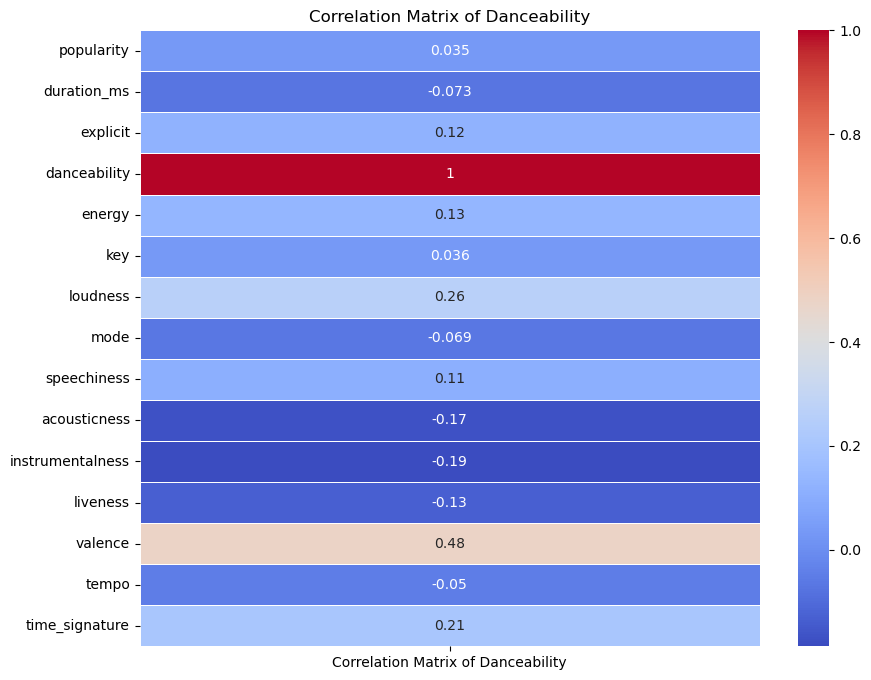

In [16]:
# Correlation Matrix for dancebility
danceability_corr_matrix = df.select_dtypes(include=["int", "float", 'bool']).corrwith(df['danceability']).to_frame('Correlation Matrix of Danceability')
print(danceability_corr_matrix)

# Visualize the correlation matrix of danceability using a heatmap to show the relationships between variables
plt.figure(figsize=(10, 8))
sns.heatmap(danceability_corr_matrix, cmap='coolwarm', annot=True, linewidths=0.5)
plt.title('Correlation Matrix of Danceability')
plt.show()

**Observations:**

**Positive correlations:**
  * **Valence :** There is a positive correlation of 0.48 between danceability and valence. This means that music that is rated as more positive tends to also be rated as more danceable.
  * **Loudness :** There is a weak positive correlation of 0.26 between danceability and loudness. This means that there is a slight tendency for louder songs to be more danceable.
  * **Tempo :** There is a very weak positive of 0.05 correlation between danceability and tempo. 
  * **Time Signature :** There is a weak positive correlation of 0.21 between danceability and time signature.
  
**Negative correlations:**
  * **Acousticness :** There is a weak negative correlation of -0.17 between danceability and acousticness. This means that songs that are rated as more acoustic tend to be less danceable.
  * **Liveness :** There is a weak negative correlation of -0.13 between danceability and liveness. This means that live songs tend to be less danceable.
  * **Instrumentality :** There is a weak negative correlation of -0.19 between danceability and instrumentality. This means that songs with more instruments tend to be less danceable.
  * **Speechiness :** There is a weak negative correlation of -0.11 between danceability and speechiness. This means that songs with a lot of speech tend to be less danceable.

## Are songs with high dancebality score more popular?

In [17]:
import plotly.express as px

# Visualizing Danceability vs Popularity
fig = px.scatter(df, x='danceability', y='popularity', title='Danceability vs Popularity',
                 trendline='ols',  # Ordinary Least Squares regression line
                 labels={'danceability': 'Danceability', 'popularity': 'Popularity'},
                 trendline_color_override='red')
fig.show()

**Observations:**

* Tracks that are more danceable tend to be more positive and louder, possibly because these characteristics contribute to a track's energetic feel, which can encourage dancing.
* Negative correlations with acousticness and instrumentalness might imply that electronic and vocal-driven tracks are generally more danceable.
* Given the weak correlation with popularity, it's likely that danceability is just one of several factors that listeners consider when determining their preference for a track.

In conclusion, while danceability contributes to the appeal of a track, it is one of many elements that combine to affect a track's popularity. The most successful tracks is likely to have a balance of danceability with other appealing attributes.

# Modeling

**Model Selection:**
Multiple regression models including Linear Regression, Decision Tree Regression, Random Forest Regression, and K-Nearest Neighbors Regression are chosen for predicting danceability.

In [18]:
spotify_data = df.copy()
spotify_data.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [20]:
# Remove all categorical columns from the dataframe and store it in new variable spotify_data
spotify_data = df.drop(labels=["track_id", "artists", "album_name", "track_name", "track_genre"], axis=1)

In [21]:
spotify_data.head()

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,73,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4
1,55,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4
2,57,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4
3,71,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3
4,82,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4


In [22]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Split the dataset into features (X) and target variable (y), where the target variable is "danceability"
X = spotify_data.drop("danceability", axis=1)
y = spotify_data["danceability"]

# Split the dataset into training and testing sets, with 80% for training and 20% for testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=21)


### Linear Regression Model

In [23]:
from sklearn.linear_model import LinearRegression

# Linear Regression Model
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

#Evaluating Linear Regression Model
y_pred_linear = linear_model.predict(X_test)
mse_linear = mean_squared_error(y_test, y_pred_linear)
mae_linear = mean_absolute_error(y_test, y_pred_linear)
r2_linear = r2_score(y_test, y_pred_linear)


print("Linear Regression:")
print(f"Mean Squared Error (MSE): {mse_linear}")
print(f"Mean Absolute Error (MAE): {mae_linear}")
print(f"R-squared (R2): {r2_linear}")

import pickle

# Save the trained Linear Regression model to a pickle file
filename = "linear_regression_model.pickle"
with open(filename, "wb") as file:
    pickle.dump(linear_model, file)

# Load the saved Linear Regression model from the pickle file
with open(filename, "rb") as file:
    loaded_linear_model = pickle.load(file)

Linear Regression:
Mean Squared Error (MSE): 0.019260582358974376
Mean Absolute Error (MAE): 0.11095835282259399
R-squared (R2): 0.3601231544401845


### Decision Tree Regression Model

In [24]:
from sklearn.tree import DecisionTreeRegressor

# Decision Tree Regression Model
decision_tree_model = DecisionTreeRegressor()
decision_tree_model.fit(X_train, y_train)

#Evaluating Decision Tree Regression Model
y_pred_dt = decision_tree_model.predict(X_test)
mse_dt = mean_squared_error(y_test, y_pred_dt)
mae_dt = mean_absolute_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print("\nDecision Tree Regression:")
print(f"Mean Squared Error (MSE): {mse_dt}")
print(f"Mean Absolute Error (MAE): {mae_dt}")
print(f"R-squared (R1): {r2_dt}")


# Save the trained Decision Tree Regression model to a pickle file
filename = "decision_tree_regression_model.pickle"
with open(filename, "wb") as file:
    pickle.dump(decision_tree_model, file)

# Load the saved Decision Tree Regression model from the pickle file
with open(filename, "rb") as file:
    loaded_decision_tree_model = pickle.load(file)



Decision Tree Regression:
Mean Squared Error (MSE): 0.015909167602192985
Mean Absolute Error (MAE): 0.07731900438596492
R-squared (R1): 0.47146416494357035


### Random Forest Regression Model

In [27]:
from sklearn.ensemble import RandomForestRegressor

# Random Forest Regression Model
random_forest_model = RandomForestRegressor()
random_forest_model.fit(X_train, y_train)

#Evaluating Random Forest Regression Model
y_pred_rf = random_forest_model.predict(X_test)
mse_rf = mean_squared_error(y_test, y_pred_rf)
mae_rf = mean_absolute_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print("\nRandom Forest Regression:")
print(f"Mean Squared Error (MSE): {mse_rf}")
print(f"Mean Absolute Error (MAE): {mae_rf}")
print(f"R-squared (R2): {r2_rf}")

# Save the trained Random Forest Regression model to a pickle file
filename = "random_forest_regression_model.pickle"
with open(filename, "wb") as file:
    pickle.dump(random_forest_model, file)

# Load the saved Random Forest Regression model from the pickle file
with open(filename, "rb") as file:
    loaded_random_forest_model = pickle.load(file)


Random Forest Regression:
Mean Squared Error (MSE): 0.007867031837821887
Mean Absolute Error (MAE): 0.060745041710526367
R-squared (R2): 0.7386407418798233


### K-Nearest Neighbors Regression Model

In [28]:
from sklearn.neighbors import KNeighborsRegressor

# K-Nearest Neighbors Regression Model
knn_model = KNeighborsRegressor()
knn_model.fit(X_train, y_train)

# Evaluating K-Nearest Neighbors Regression Model
y_pred_knn = knn_model.predict(X_test)
mse_knn = mean_squared_error(y_test, y_pred_knn)
mae_knn = mean_absolute_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)

print("\nK-Nearest Neighbors Regression:")
print(f"Mean Squared Error (MSE): {mse_knn}")
print(f"Mean Absolute Error (MAE): {mae_knn}")
print(f"R-squared (R2): {r2_knn}")

# Save the trained K-Nearest Neighbors Regression model to a pickle file
filename = "knn_regression_model.pickle"
with open(filename, "wb") as file:
    pickle.dump(knn_model, file)

# Load the saved K-Nearest Neighbors Regression model from the pickle file
with open(filename, "rb") as file:
    loaded_knn_model = pickle.load(file)


K-Nearest Neighbors Regression:
Mean Squared Error (MSE): 0.027314793796473686
Mean Absolute Error (MAE): 0.12318395701754385
R-squared (R2): 0.0925453983762563


### Comparing the performance of all the four regression models:

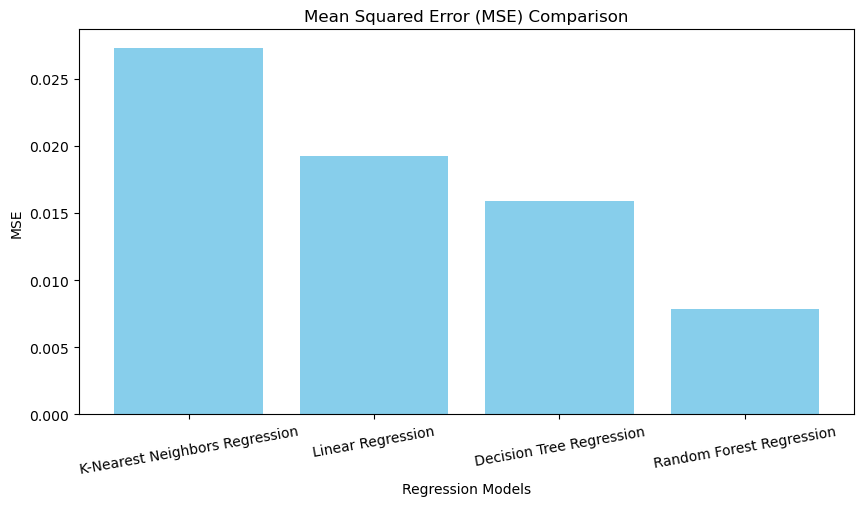

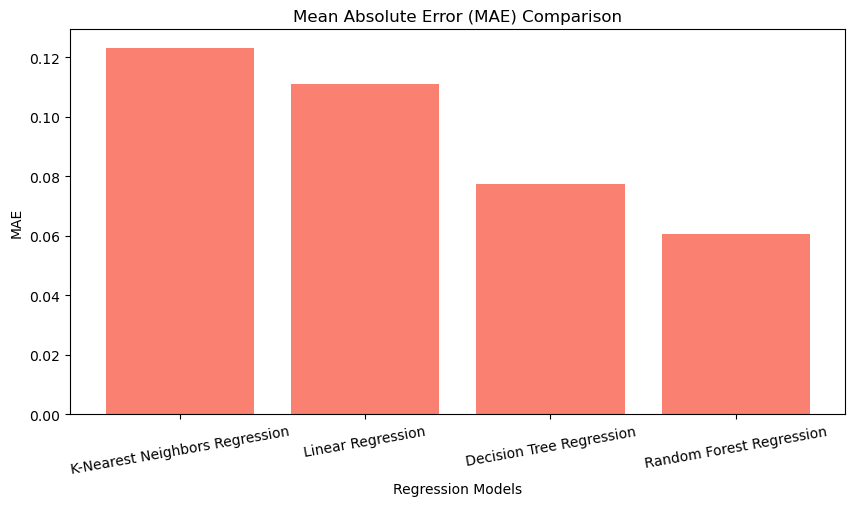

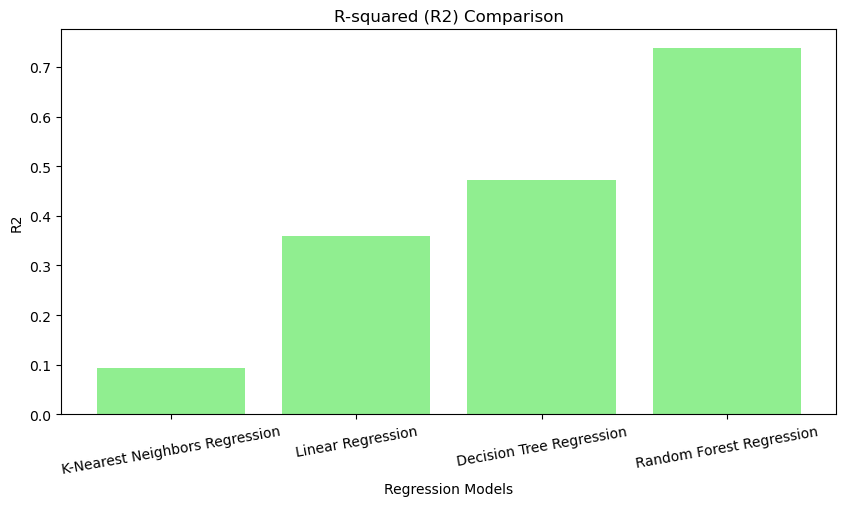

In [29]:
# Visualizing the performance of the four regression models
models = ['Linear Regression', 'Decision Tree Regression', 'Random Forest Regression', 'K-Nearest Neighbors Regression']
mse_scores = [mse_linear, mse_dt, mse_rf, mse_knn]
mae_scores = [mae_linear, mae_dt, mae_rf, mae_knn]
r2_scores = [r2_linear, r2_dt, r2_rf, r2_knn]

# Sort the data by scores (in descending order)
sorted_data = sorted(zip(models, mse_scores, mae_scores, r2_scores), key=lambda x: x[1], reverse=True)
sorted_models, sorted_mse, sorted_mae, sorted_r2 = zip(*sorted_data)

# Plotting MSE scores
plt.figure(figsize=(10, 5))
plt.bar(sorted_models, sorted_mse, color='skyblue')
plt.title('Mean Squared Error (MSE) Comparison')
plt.xlabel('Regression Models')
plt.ylabel('MSE')
plt.xticks(rotation=10)
plt.show()

# Plotting MAE scores
plt.figure(figsize=(10, 5))
plt.bar(sorted_models, sorted_mae, color='salmon')
plt.title('Mean Absolute Error (MAE) Comparison')
plt.xlabel('Regression Models')
plt.ylabel('MAE')
plt.xticks(rotation=10)
plt.show()

# Plotting R-squared scores
plt.figure(figsize=(10, 5))
plt.bar(sorted_models, sorted_r2, color='lightgreen')
plt.title('R-squared (R2) Comparison')
plt.xlabel('Regression Models')
plt.ylabel('R2')
plt.xticks(rotation=10)
plt.show()

### Summary of Models Performance

The metrics used for evaluation are:

* **Mean Squared Error (MSE):** Lower MSE indicates a better fit,  representing the average squared difference between predicted and actual values.
* **Mean Absolute Error (MAE):** Lower MAE indicates a better fit, representing the average absolute difference between predicted and actual values.
* **R-squared (R²):** A higher R² indicates a better fit, representing the proportion of variance in the dependent variable explained by the independent variables. However, it's important to note that a high R² value can be misleading if the model is overfit.

Analysing how each model performed:

* **Linear Regression:** Linear Regression model exhibits moderate performance across all metrics (MSE: 0.019, MAE: 0.111, R²: 0.360).
* **Decision Tree Regression:** Decision Tree model shows better performance than Linear Regression on all metrics (MSE: 0.016, MAE: 0.077, R²: 0.470).
* **Random Forest Regression:** Random Forest model outperforms all other models on all metrics (MSE: 0.008, MAE: 0.061, R²: 0.739).
* **K-Nearest Neighbors Regression:** KNN model has lower performance compared to Decision Tree Regression on all metrics (MSE: 0.027, MAE: 0.123, R²: 0.093).
* **Neural Network Regression:** NN model has the worst performance on all metrics (MSE: 0.030, MAE: 0.140, R²: -0.00002). A negative R² value implies the model performs worse than predicting the average target value.

#### Best Model Selection

Based on the R-squared values and considering the fact that it also has the lowest MSE and MAE, **Random Forest Regression** emerges as the clear winner. It demonstrates the best fit among the compared models. 

# Cross-validation
Cross-validation is performed for the Random Forest Regression model to ensure its reliability and generalization to new data. The cross-validation mean squared error is calculated and interpreted here.

In [31]:
# Performing cross-validation for Random Forest Regressor
from sklearn.model_selection import cross_val_score

# Perform cross-validation
cv_scores = cross_val_score(random_forest_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')

# Calculate the mean of the cross-validation scores
cv_mse_mean = -cv_scores.mean()

print(f"Cross-validation Mean Squared Error (MSE) for Random Forest: {cv_mse_mean}")

Cross-validation Mean Squared Error (MSE) for Random Forest: 0.008324994726502104


Cross-validation was performed for a Random Forest Regressor model using the mean squared error (MSE) as the evaluation metric and below are the results obtained from the same:

* **Model:** Random Forest Regressor
* **Metric:** Mean Squared Error (MSE) (notice the negative sign `neg_` used for minimization)
* **Cross-validation Folds:** 5 (as specified by `cv=5`)

* The cross-validation process resulted in an average MSE of approximately **0.00833** when evaluating the Random Forest Regressor model.

Overall, this result indicates the performance of the Random Forest Regressor model on the training data when evaluated through cross-validation using MSE as the metric. Lower MSE values indicate better performance, so the model appears to perform relatively well on the training data.

# Deployment

**Model Deployment:**
The best performing model **(Random Forest Regression)** with lowest MSE and highest R-squared value is selected to predict danceability for all tracks. A **playlist of top 50 tracks** based on predicted danceability is created, which can be used to enhance user experience and engagement on the platform.


In [32]:
# We can use the best performing model to predict danceability for all tracks and create a playlist of top 50 tracks.

predict_all = random_forest_model.predict(X)

dance = pd.DataFrame(random_forest_model.predict(X))
dance = dance.rename(columns={0: "danceability"})

index = dance.sort_values(by="danceability", ascending=False)[:50].index
playlist = df.loc[index]

# Add a new column for track number
playlist['top_50_rank'] = range(1, len(playlist) + 1)

# Move the 'track_number' column to the first position
playlist.insert(0, 'top_50_rank', playlist.pop('top_50_rank'))


# Define the print statement with ANSI escape codes for bold text
print("\033[1mTop 50 Playlist Based On Danceability:\033[0m")
playlist

Top 50 Playlist Based On Danceability:


,top_50_rank,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
78749,1,01ygrG3sTaMaU3rmAkL8Wr,GABBY;Anstandslos & Durchgeknallt,Ballermann Hits Party 2023,Klempner Klaus,0,155820,0,0.712,0.859,...,-4.615,1,0.0568,0.001530,0.000000,0.0530,0.8020,133.984,4,party
66008,2,1R77CxppnheFfIGNgQ9NF8,BeatBo;Fisher-Price,Fisher-Price BeatBo,Freeze Dance,51,76888,0,0.800,0.887,...,-3.419,0,0.2930,0.276000,0.000005,0.3450,0.4870,135.034,4,kids
56334,3,1aPqexHVW20OTamBHdWWVL,Timeflies,Just For Fun (Deluxe),Undress Rehearsal,60,214786,0,0.953,0.652,...,-4.159,0,0.0849,0.004560,0.000000,0.0287,0.7300,122.997,4,indie-pop
53697,4,1aPqexHVW20OTamBHdWWVL,Timeflies,Just For Fun (Deluxe),Undress Rehearsal,60,214786,0,0.953,0.652,...,-4.159,0,0.0849,0.004560,0.000000,0.0287,0.7300,122.997,4,house
57682,5,1aPqexHVW20OTamBHdWWVL,Timeflies,Just For Fun (Deluxe),Undress Rehearsal,60,214786,0,0.953,0.652,...,-4.159,0,0.0849,0.004560,0.000000,0.0287,0.7300,122.997,4,indie
94234,6,0RCgQNZ5SAjPukI3OXquFN,gavn!,"Here, just for now",City of Angels,57,133972,0,0.548,0.548,...,-9.017,1,0.1040,0.462000,0.000000,0.1320,0.3660,146.271,4,sad
15292,7,31Ep5JVlhdyLe5aj06alAp,Stract;Shiloh Dynasty;Burgettii,Losing Interest (Remix),Losing Interest - Remix,58,270260,1,0.963,0.417,...,-15.525,0,0.1820,0.635000,0.006860,0.2750,0.7110,114.968,4,chill
21057,8,0k2GOhqsrxDTAbFFSdNJjT,Sean Paul,The Trinity,Temperature,79,218573,0,0.951,0.600,...,-4.675,0,0.0685,0.106000,0.000000,0.0712,0.8220,125.040,4,dancehall
20717,9,0k2GOhqsrxDTAbFFSdNJjT,Sean Paul,The Trinity,Temperature,79,218573,0,0.951,0.600,...,-4.675,0,0.0685,0.106000,0.000000,0.0712,0.8220,125.040,4,dance
66847,10,2EN8TrBJlMwFSP0C9ZqECu,The Party Cats,Kids Dance Party 2,Funkytown - Kids Dance Party 2 Album Version,8,257399,0,0.846,0.698,...,-9.239,1,0.0429,0.013700,0.112000,0.0734,0.4870,122.413,4,kids


**By accurately predicting the danceability of tracks, online music streaming platforms can:**

* **Enhance User Experience:** Design recommendations and playlists to users' tastes, elevating satisfaction and engagement.

* **Optimize Playlist Curation:** Create dynamic playlists optimized for different occasions, activities, or moods, increasing user retention and loyalty.

* **Improve Music Discovery:** Introduce users to new tracks and artists with similar danceability profiles which increases exploration and discovery within the platform.

* **Increase Platform Engagement:**  Offer relevant content, enticing users to spend more time, thereby boosting retention and revenue potential.

Overall, using predictive modeling for danceability prediction can differentiate the platform from competitors, attract new users, and retain existing ones, thereby driving growth and profitability.

**Scope for future improvements:**

* Explore additional audio features or incorporate external data sources like user listening history, social media interactions to improve the predictive power of the models.
* Hyperparameter tuning for each model could further optimize their accuracy.
* Depending on the music streaming platform's specific needs, other relevant features (e.g., genre) could be incorporated.

# References:

* Dr Umair ul Hassan (2024) Week 7 and Week 8 Lecture Slides, Learning Materials and Videos – Machine Learning in Python, MS5114 Advanced Programming for Business, University of Galway, unpublished.


* Yiyu Wang (2024) Week 8 Tutotial: Regression using scikit-learn, MS5114 Advanced Programming for Business, University of Galway, unpublished.


* Machine learning Python Machine Learning. Available at: https://www.w3schools.com/python/python_ml_getting_started.asp